<a href="https://colab.research.google.com/github/nissimlab/scRNA-seq-fixed-pancreas/blob/main/figures_plotting/Plotting_macrophage_trajectory_scVelo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Macrophage trajectory analysis -- scVelo
# Ran 20230420
# Figure 6F

In [1]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


#Colab

In [2]:
!pip install setuptools-scm scanpy anndata leidenalg watermark pandas===1.5.3 umap-learn==0.5.3 plotnine==0.8.0 panel muon anndata2ri triku ray harmonypy rpy2==3.4.5 infercnvpy matplotlib==3.5.0 scvelo==0.2.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 87.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.7/292.7 kB 24.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 MB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 17.2 MB/s eta 0:00:00
  Pr

## Load packages

In [1]:
import sys
sys.path.append('/usr/local/lib/python3.9/site-packages/')

import scanpy as sc
import numpy as np
import re
import os
import pandas as pd
import seaborn as sb
import matplotlib
import matplotlib.pyplot as pl
import scanpy.external as sce
from matplotlib import colors
import scvelo as scv
import scanpy as sc
import numpy as np
import loompy
import triku as tk

scv.settings.verbosity = 3
import matplotlib.pyplot as pl

pl.rcParams['pdf.fonttype'] = 'truetype'
sc.set_figure_params(vector_friendly=False,dpi_save=300,transparent=True)
pl.rcParams['lines.linewidth'] = 0.1
sc.set_figure_params(color_map='viridis')
colorsComb = np.vstack([pl.cm.Reds(np.linspace(0, 1, 10)), pl.cm.Greys_r(np.linspace(0.7, 0.8, 0))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

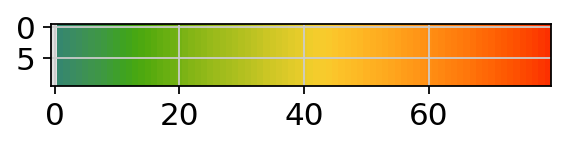

In [2]:
import colorcet as cc

xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
colorsComb = np.vstack([pl.cm.Greys_r(np.linspace(0.8,0.1, 1)), cc.cm.rainbow_bgyr_35_85_c72(np.linspace(0.2,1, 100))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
pl.imshow(xs, cmap=mymap);  # use tab completion to choose

In [3]:
%load_ext watermark
%watermark
%watermark --iversions -v -m -p numpy,scipy,sklearn,anndata,scvelo

Last updated: 2023-06-26T19:50:18.360065+00:00

Python implementation: CPython
Python version       : 3.10.12
IPython version      : 7.34.0

Compiler    : GCC 9.4.0
OS          : Linux
Release     : 5.15.107+
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

Python implementation: CPython
Python version       : 3.10.12
IPython version      : 7.34.0

numpy  : 1.22.4
scipy  : 1.10.1
sklearn: 1.2.2
anndata: 0.9.1
scvelo : 0.2.4

Compiler    : GCC 9.4.0
OS          : Linux
Release     : 5.15.107+
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

loompy    : 3.0.7
seaborn   : 0.12.2
sys       : 3.10.12 (main, Jun  7 2023, 12:45:35) [GCC 9.4.0]
scvelo    : 0.2.4
colorcet  : 3.0.1
re        : 2.2.1
matplotlib: 3.5.0
pandas    : 1.5.3
scanpy    : 1.9.3
numpy     : 1.22.4
triku     : 2.1.6



In [ ]:
%cd /content/

/content


In [ ]:
folder='/content/drive/MyDrive/CIP_v3_data/CIP_all/Immune/'

samplename='CIP_all_v3_'
random_state=42


import os
os.chdir(folder)
if not os.path.exists('./figures/'):
    os.makedirs('./figures/')


##annotated dataset

In [ ]:
adata=sc.read(samplename+'_immune_20230214_annotated.h5ad')

Merge loom and adata

In [ ]:
velocyto=scv.read('/content/drive/MyDrive/CIP_v3_data/CIP_all/CIP_all_v3_looms_combined.loom')

In [ ]:
# Merge velocyto with cellranger matrix
adata = scv.utils.merge(adata, velocyto)
adata

In [ ]:
##save dataset
adata.write('CIP_v3_immune_loom_20230316.h5ad')

In [ ]:
##load dataset
adata=sc.read('CIP_v3_immune_loom_20230316.h5ad')

#run scVelo on Macrophages

In [ ]:
#Macrophage only
adata= adata[~adata.obs['annotated'].isin(['T / NK','B','Neutrophils', 'Plasmacytoid DC', 'cDC1', 'Cycling cDC1', 'mregDC']),:].copy()
adata

AnnData object with n_obs × n_vars = 23602 × 19752
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'outlier', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'ADM', 'Acinar', 'Ductal', 'annotated', 'annotated_fine', 'annotated_ADM', 'annotated_immunegrouped', 'leiden_r0.1', 'leiden_r0.2', 'leiden_r0.3', 'leidenX', 'leidenY', 'annotated2', 'leidenZ', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_count

##pick new HVG

In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']
sc.pp.filter_genes(adata, min_cells=5)

In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']
#PCA
sc.pp.pca(adata, n_comps=30,random_state=42,use_highly_variable=False, svd_solver="arpack")
#Harmony
sce.pp.harmony_integrate(adata, key='sample', epsilon_cluster = 1e-4, epsilon_harmony = 1e-5, max_iter_harmony=50)
# #neighbors
sc.pp.neighbors(adata, use_rep='X_pca_harmony',  n_neighbors=int(0.5*len(adata) ** 0.5 // 2), metric='cosine')

2023-06-23 19:51:25,006 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2023-06-23 19:51:30,910 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2023-06-23 19:51:31,105 - harmonypy - INFO - Iteration 1 of 50
INFO:harmonypy:Iteration 1 of 50
2023-06-23 19:51:41,486 - harmonypy - INFO - Iteration 2 of 50
INFO:harmonypy:Iteration 2 of 50
2023-06-23 19:51:50,395 - harmonypy - INFO - Iteration 3 of 50
INFO:harmonypy:Iteration 3 of 50
2023-06-23 19:51:58,125 - harmonypy - INFO - Iteration 4 of 50
INFO:harmonypy:Iteration 4 of 50
2023-06-23 19:52:03,166 - harmonypy - INFO - Iteration 5 of 50
INFO:harmonypy:Iteration 5 of 50
2023-06-23 19:52:06,679 - harmonypy - INFO - Iteration 6 of 50
INFO:harmonypy:Iteration 6 of 50
2023-06-23 19:52:10,142 - harmonypy - INFO - Converged after 6 iterations
INFO:harmonypy:Converged after 6 iterations


In [ ]:
tk.tl.triku(adata, n_windows=100)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))


 Number of highly variable genes: 1421


###normalize spliced and unspliced

In [ ]:
adata.X=adata.layers["unspliced"]
# check the top rows of data matrix on X
adata.X=adata.X.todense()
adata.X[0:25, 0:10]

matrix([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 2, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],

In [ ]:
adata.X=adata.layers['spliced']
proportional_fitting = sc.pp.normalize_total(adata, target_sum=None, inplace=False)

In [ ]:
adata.layers["spliced_log1pPF_normalization"] = sc.pp.log1p(proportional_fitting["X"])
adata.layers["spliced"] = sc.pp.normalize_total(adata, target_sum=None, layer="spliced_log1pPF_normalization", inplace=False)["X"]

In [ ]:
adata.X=adata.layers['unspliced']
proportional_fitting = sc.pp.normalize_total(adata, target_sum=None, inplace=False)

In [ ]:
adata.layers["unspliced_log1pPF_normalization"] = sc.pp.log1p(proportional_fitting["X"])
adata.layers["unspliced"] = sc.pp.normalize_total(adata, target_sum=None, layer="unspliced_log1pPF_normalization", inplace=False)["X"]

In [ ]:
adata

AnnData object with n_obs × n_vars = 23602 × 19125
    obs: 'sample', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'outlier', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'ADM', 'Acinar', 'Ductal', 'annotated', 'annotated_fine', 'annotated_ADM', 'annotated_immunegrouped', 'leiden_r0.1', 'leiden_r0.2', 'leiden_r0.3', 'leidenX', 'leidenY', 'annotated2', 'leidenZ', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_count

In [ ]:
adata.X=adata.layers["cellbender"]

In [ ]:
scv.pp.filter_genes(adata, min_shared_counts=30)

Filtered out 10651 genes that are detected 30 counts (shared).


In [ ]:
sc.pp.neighbors(adata,  n_neighbors=int(0.5*len(adata) ** 0.5 // 2), metric='cosine')

In [ ]:
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

computing moments based on connectivities
    finished (0:00:19) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [ ]:
scv.tl.recover_dynamics(adata,n_jobs=8)

In [ ]:
#Estimation of RNA velocity using model's inferred splicing kinetics
%%time
scv.tl.velocity(adata, mode='dynamical',filter_genes=False,use_raw=False,use_highly_variabl=True)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:27) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/8 cores)


  0%|          | 0/23602 [00:00<?, ?cells/s]

    finished (0:01:23) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
CPU times: user 1min 39s, sys: 9.66 s, total: 1min 49s
Wall time: 1min 51s


In [ ]:
##RUN by KA
#Cells annotated on 3/29/2023
adata.obs['annotated'] = adata.obs['annotated2'].cat.add_categories(['Pancreas resident macrophage'])

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['Lyve1+ macrophage','Cxcr1+ macrophage'])] = 'Pancreas resident macrophage' #Cfh, Cd36, Cd163
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['Trem2+ Ms4a7+ macrophage'])] = 'Trem2+ macrophage'

adata.obs['annotated'] = adata.obs['annotated'].cat.remove_unused_categories()

In [ ]:
###final colors -- dictionary for
color_dict={
    'Arg1+ macrophage':'#279e68',
    'Cycling macrophage': '#98df8a',
    'Pancreas resident macrophage': '#1f77b4',
    'Retnla+ Lyz1+ macrophage': '#ff7f0e',
    'Trem2+ macrophage': '#d62728',
}

In [ ]:
category_colors = []
for category in adata.obs['annotated'].cat.categories:
    color = color_dict[category]
    category_colors.append(color)

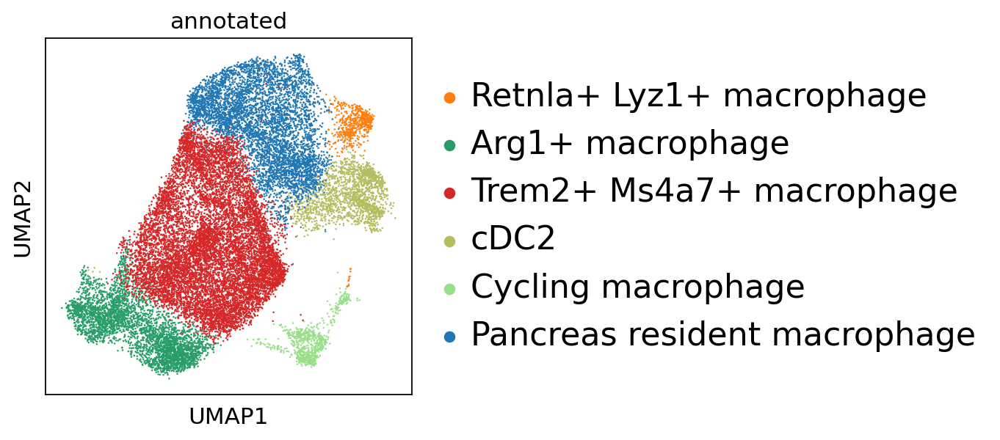

In [ ]:
sc.pl.umap(adata, color=['annotated'],legend_loc='right margin',palette=color_dict,legend_fontoutline=3,vmax='p99.9',legend_fontsize=20, legend_fontweight='normal',frameon=True)

In [ ]:
colors_time=['#88a0dc', '#381a61', '#7c4b73', '#ed968c', '#ab3329', '#e78429', '#f9d14a']

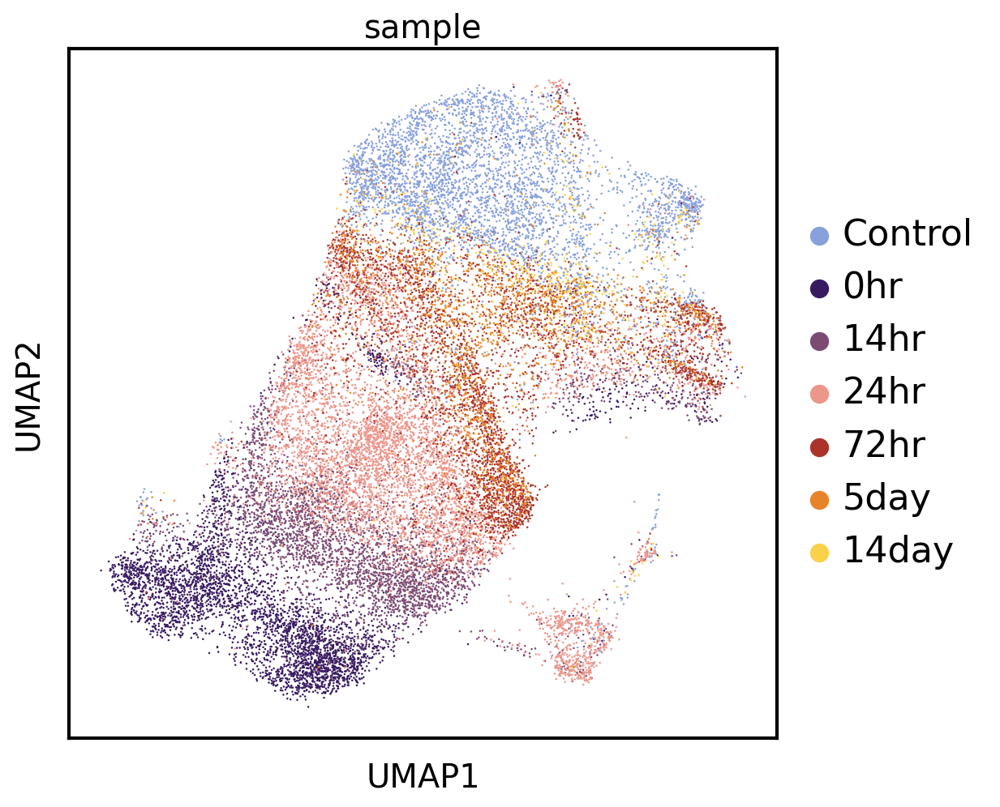

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['sample'], palette=colors_time,legend_loc='right margin',legend_fontoutline=3,vmax='p99.9',legend_fontsize=20, legend_fontweight='normal',frameon=True)

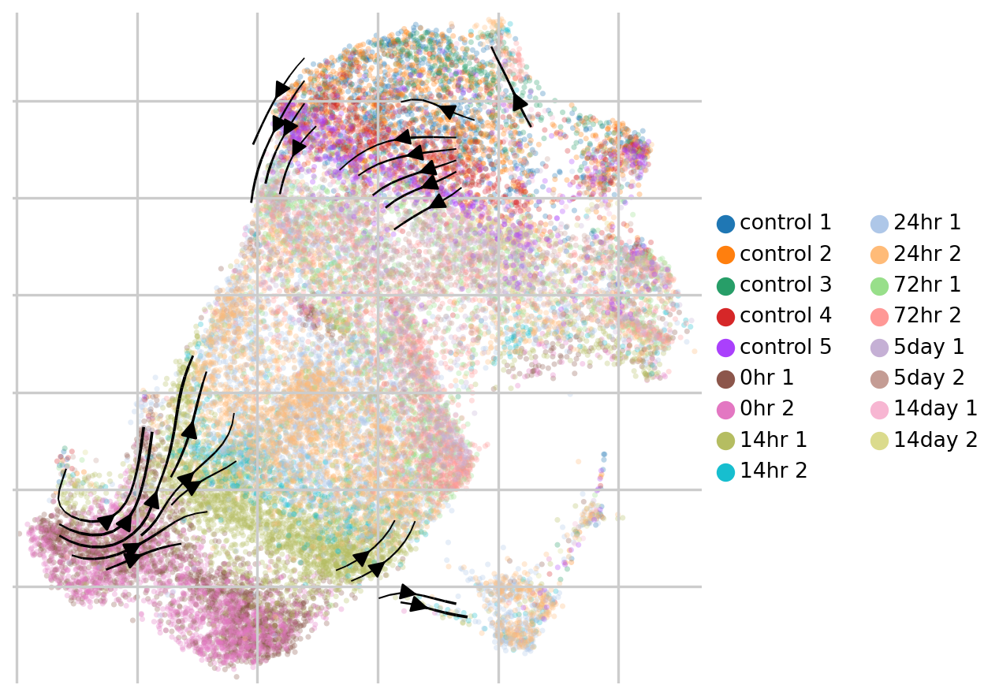

In [ ]:
#projecting velocities into the embedding (arrows)
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', arrow_size=2,color='donor',legend_fontsize=12, title='', smooth=.8, min_mass=4)

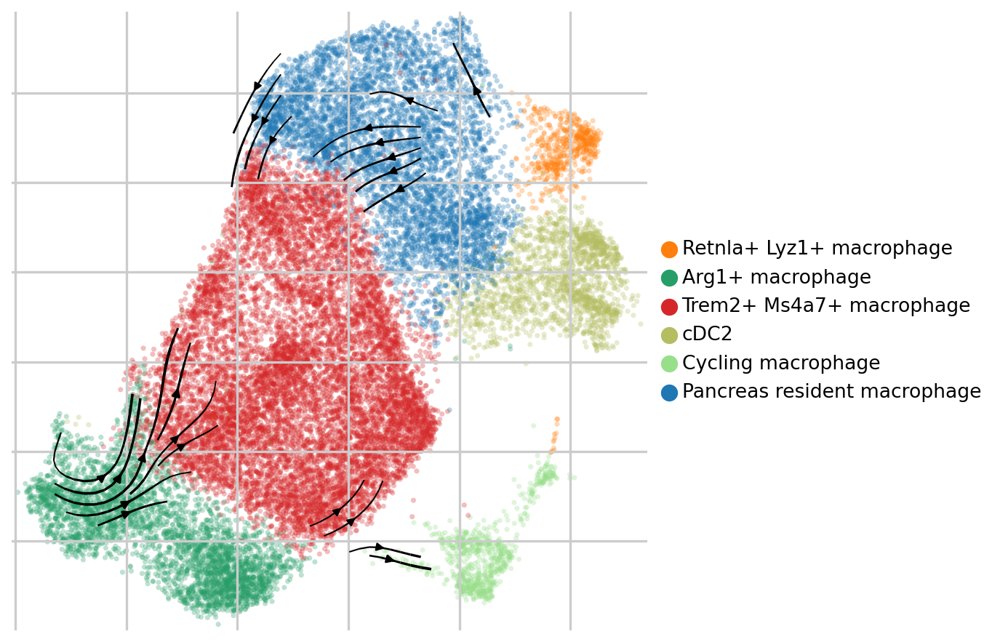

In [ ]:
#projecting velocities into the embedding (arrows)
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', color='annotated',legend_fontsize=12, title='', smooth=.8, min_mass=4)

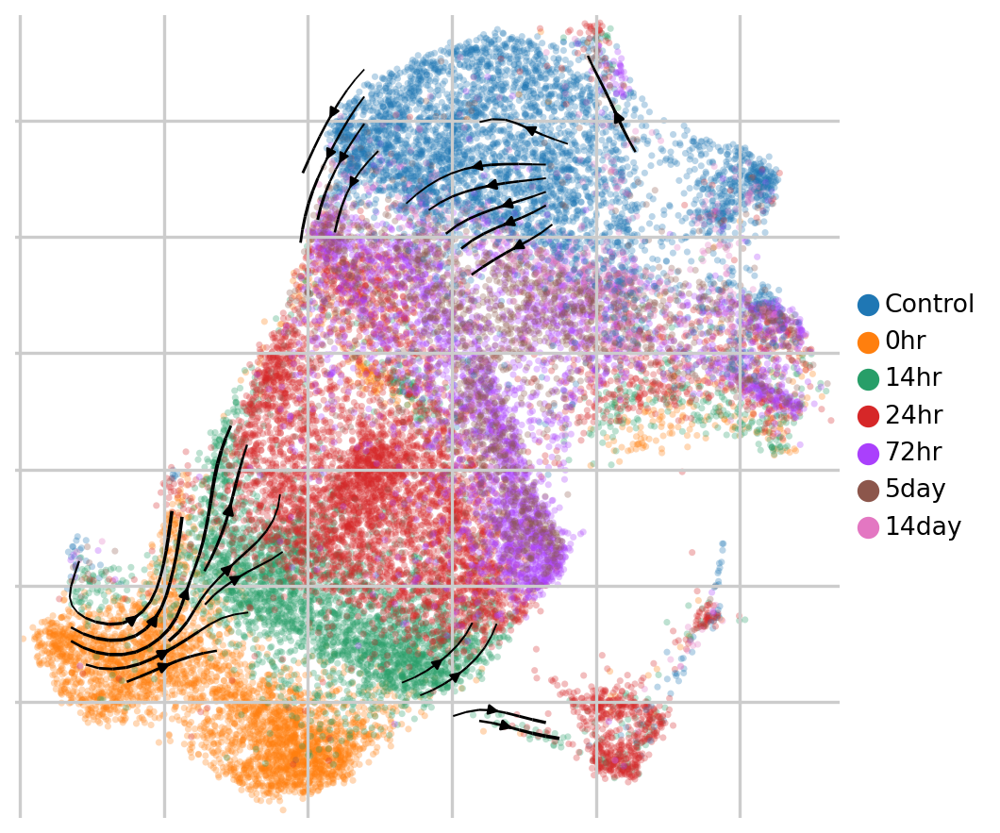

In [ ]:
#projecting velocities into the embedding (arrows)
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', color='sample',legend_fontsize=12, title='', smooth=.8, min_mass=4)

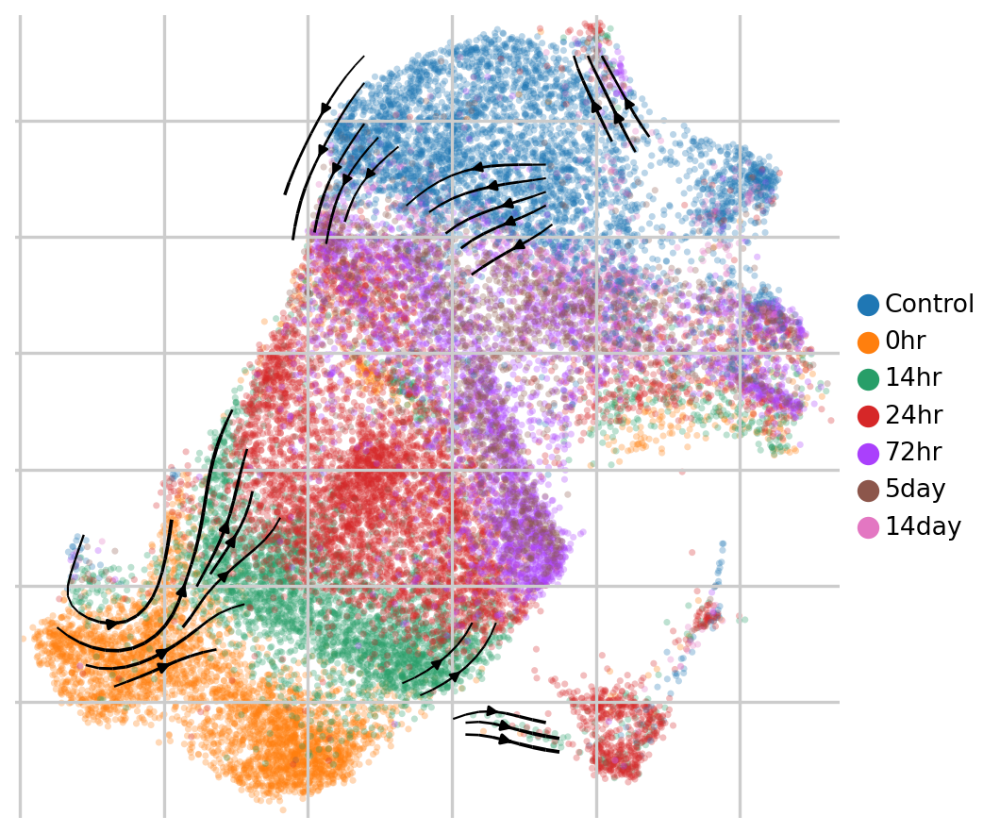

In [ ]:
#projecting velocities into the embedding (arrows)
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', color='sample',legend_fontsize=12, title='', smooth=1, min_mass=4)

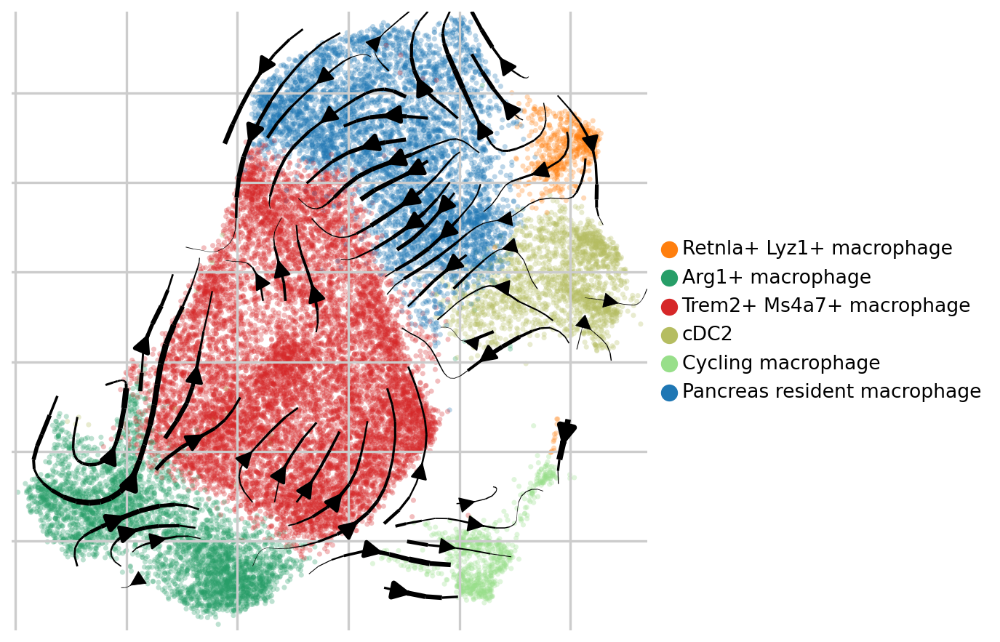

In [ ]:
#projecting velocities into the embedding (arrows)
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', color='annotated',legend_fontsize=12, title='',linewidth=2.2, arrow_size=2.2,smooth=0.8, min_mass=3,density = 1)

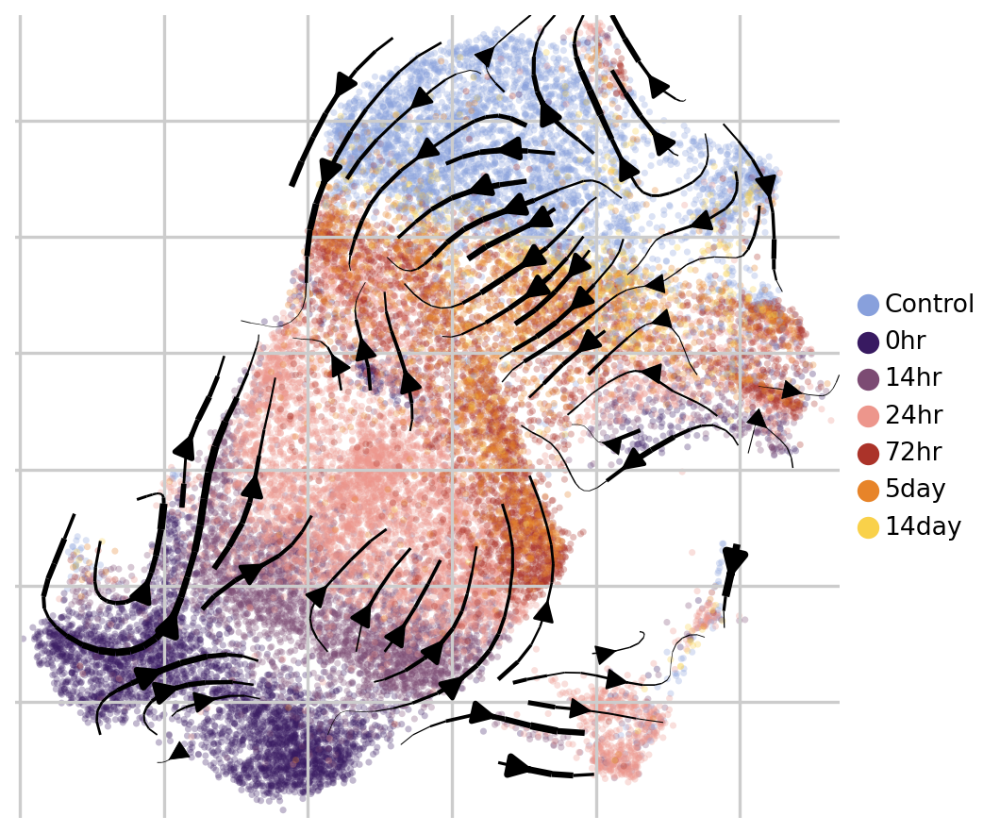

In [ ]:
#projecting velocities into the embedding (arrows)
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', color='sample',legend_fontsize=12, title='',linewidth=2.2, arrow_size=2.2,smooth=0.8, min_mass=3,density = 1)

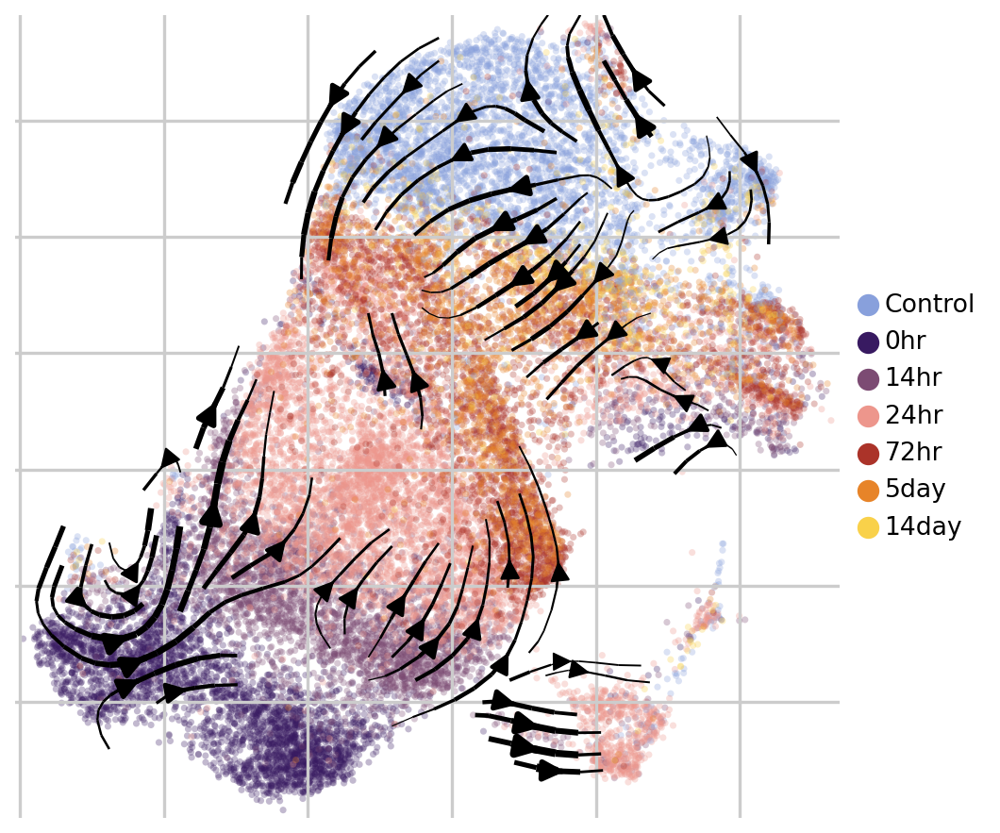

In [ ]:
#projecting velocities into the embedding (arrows)
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', color='sample',legend_fontsize=12, title='',linewidth=2, arrow_size=2,smooth=0.8, min_mass=3.5,density = 1.2)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


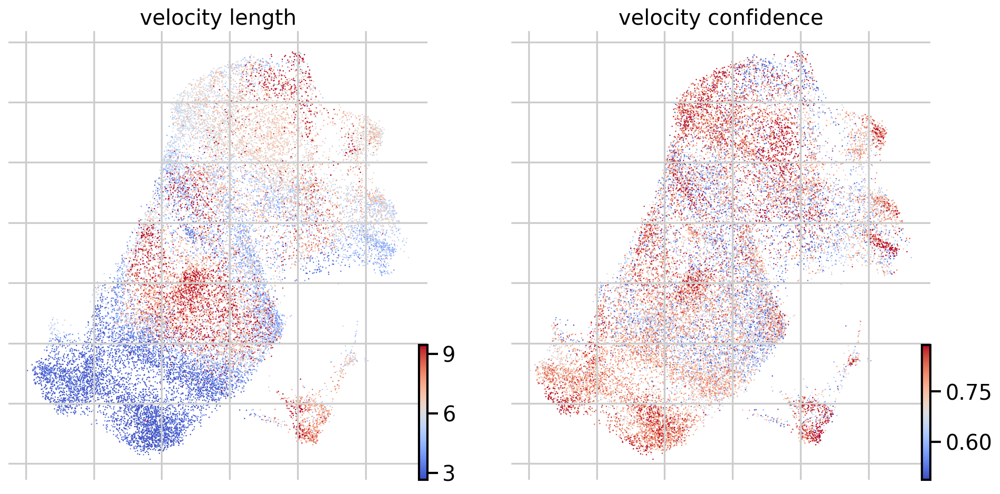

In [ ]:
#length = speed or rate of differentiation
#confidence is coherence of vector field (how they correlated with neighboring velocities)
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [ ]:
df = adata.obs.groupby('annotated')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

In [ ]:
scv.pl.velocity_embedding_stream(adata, basis='pca', color=['leiden_r0.5','annotated','sample','donor'],legend_loc='right margin',legend_fontsize=12, title='', smooth=.8, min_mass=4)

In [ ]:
adata.write('_MacDCSubset_momentsVelocity_20230414_annotated.h5ad')

In [ ]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, 'annotated', method='wilcoxon',n_genes=adata.shape[1],key_added='wilcoxon',corr_method='bonferroni',
use_raw=False,layer='PFlog1pPF_normalization')
markers=pd.DataFrame(adata.uns['wilcoxon']['names']).head(100)
markers

,Retnla+ Lyz1+ macrophage,Arg1+ macrophage,Trem2+ Ms4a7+ macrophage,cDC2,Cycling macrophage,Pancreas resident macrophage
0,Retnla,Thbs1,Trem2,H2-Ab1,Mki67,C1qa
1,Ear2,Hif1a,Ctsd,H2-Eb1,Stmn1,C1qc
2,Fn1,Pkm,Ms4a7,Cd74,Birc5,Cst3
3,Crip1,Arg1,Lamp1,H2-Aa,Hmgb2,Serinc3
4,Lyz1,Fn1,Ctsb,Plbd1,Top2a,Mrc1
...,...,...,...,...,...,...
95,Tnip3,Klhl2,Glmp,Rpl10a,Mcm7,Ppp3ca
96,Sgms1,Timp1,Mylip,Emb,Cmc2,Ahnak
97,H2-DMb2,Slc15a3,Cd84,Rps15,Cbx5,Stk17b
98,Arhgap6,Rnpep,Man1c1,Rps20,Brip1,Timd4


In [ ]:
n= 15
wilcoxon=pd.DataFrame(adata.uns["wilcoxon"]['names']).head(n)
markers=wilcoxon

In [ ]:
#set markers
markers1=markers.to_dict('list')
print(markers1)

{'Retnla+ Lyz1+ macrophage': ['Retnla', 'Ear2', 'Fn1', 'Crip1', 'Lyz1', 'H2-DMa', 'Lpl', 'Trerf1', 'Chn2', 'Lsp1', 'H2-Ab1', 'Cd226', 'Cd74', 'H2-DMb1', 'H2-Eb1'], 'Arg1+ macrophage': ['Thbs1', 'Hif1a', 'Pkm', 'Arg1', 'Fn1', 'Adam8', 'Vcan', 'Plcb1', 'Arhgap24', 'Gda', 'Itgam', 'Ccl2', 'Por', 'Cacna1d', 'Ctsl'], 'Trem2+ Ms4a7+ macrophage': ['Trem2', 'Ctsd', 'Ms4a7', 'Lamp1', 'Ctsb', 'Tmem86a', 'Syngr1', 'Lgmn', 'Hexb', 'Abca1', 'Cd300c2', 'Atp13a2', 'Selenop', 'Pnpla7', 'Itm2b'], 'cDC2': ['H2-Ab1', 'H2-Eb1', 'Cd74', 'H2-Aa', 'Plbd1', 'H2-DMb1', 'Lsp1', 'H2-DMa', 'Napsa', 'Fxyd5', 'Ciita', 'Cd52', 'Gm2a', 'Coro1a', 'Cytip'], 'Cycling macrophage': ['Mki67', 'Stmn1', 'Birc5', 'Hmgb2', 'Top2a', 'Pclaf', 'Smc2', 'Cenpe', 'Cdca8', 'Tpx2', 'Smc4', 'Cenpf', 'Tmpo', 'Racgap1', 'Diaph3'], 'Pancreas resident macrophage': ['C1qa', 'C1qc', 'Cst3', 'Serinc3', 'Mrc1', 'Trf', 'Cd74', 'Cd81', 'C1qb', 'H2-Aa', 'Malat1', 'Rbpj', 'Tmem176b', 'Csf1r', 'H2-Ab1']}


In [ ]:
{'Retnla+ Lyz1+ macrophage': ['Retnla', 'Lyz1','Ear2',  'Lpl', 'Trerf1', 'Chn2', 'Lsp1', 'H2-Ab1', 'Cd226', 'Cd74', 'H2-DMb1', 'H2-Eb1'], 'Arg1+ macrophage': ['Thbs1', 'Hif1a', 'Pkm', 'Arg1', 'Fn1', 'Adam8', 'Vcan', 'Plcb1', 'Arhgap24', 'Gda', 'Itgam', 'Ccl2', 'Por', 'Cacna1d', 'Ctsl'], 'Trem2+ Ms4a7+ macrophage': ['Trem2', 'Ctsd', 'Ms4a7', 'Lamp1', 'Ctsb', 'Tmem86a', 'Syngr1', 'Lgmn', 'Hexb', 'Abca1', 'Cd300c2', 'Atp13a2', 'Selenop', 'Pnpla7', 'Itm2b'], 'cDC2': ['H2-Ab1', 'H2-Eb1', 'Cd74', 'H2-Aa', 'Plbd1', 'H2-DMb1', 'Lsp1', 'H2-DMa', 'Napsa', 'Fxyd5', 'Ciita', 'Cd52', 'Gm2a', 'Coro1a', 'Cytip'], 'Cycling macrophage': ['Mki67', 'Stmn1', 'Birc5', 'Hmgb2', 'Top2a', 'Pclaf', 'Smc2', 'Cenpe', 'Cdca8', 'Tpx2', 'Smc4', 'Cenpf', 'Tmpo', 'Racgap1', 'Diaph3'], 'Pancreas resident macrophage': ['C1qa', 'C1qc', 'Cst3', 'Serinc3', 'Mrc1', 'Trf', 'Cd74', 'Cd81', 'C1qb', 'H2-Aa', 'Malat1', 'Rbpj', 'Tmem176b', 'Csf1r', 'H2-Ab1']}
'Fn1','H2-DMa',

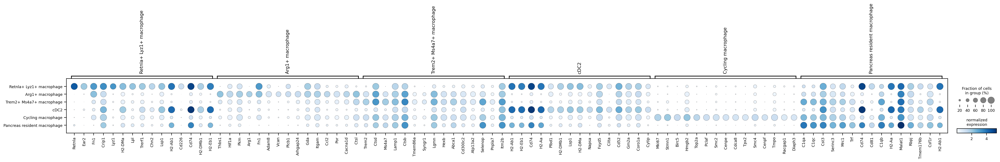

In [ ]:
sb.set_context('paper')
sc.pl.dotplot(adata, markers1, "annotated", dendrogram=False, cmap='Blues', layer='PFlog1pPF_normalization', colorbar_title='normalized\nexpression')